## Notebook Purpose
This notebook is used to compute and plot seasonal change maps due to avalanches over Lirung Glacier (Figure 10)  

#### Last updated: March 7, 2023

## TODO:
- Update imports when new library has been built up with all updates
-Generalise path to data products during revisions, after the data distribution plan is finalized


In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'


In [2]:
import numpy as np 
import geopandas as gpd
import matplotlib.pyplot as plt
from imview import pltlib
import pandas as pd
from pygeotools.lib import warplib,geolib,iolib,malib,filtlib,timelib
import os,sys,glob,shutil
from velocity_proc import glac_dyn, constants, velocity_filter, velocity_timeseries

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
%matplotlib inline

In [4]:
%cd /nobackup/sbhusha1/chapter2/lirung/202320218/ortho2m/

/nobackupp11/sbhusha1/chapter2/lirung/202320218/ortho2m


### Lirung seasonal Avalanche plotting

In [5]:
dem1 = 'dem/20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif'
dem2 = 'dem/20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif'
dem3 = 'dem/20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif'
img1 = '20150122_1040010006841E00_ortho_res_2.0m_shpclip.tif'
img2 = '20150508_104001000B3B2300_ortho_res_2.0m_shpclip.tif'
img3 = '20151229_10200100496BE700_ortho_res_2.0m_shpclip.tif'
ds_list = warplib.memwarp_multi_fn([dem1,dem2,dem3,img1,img2,img3])
dem1,dem2,dem3,img1,img2,img3 = [iolib.ds_getma(ds) for ds in ds_list]


Warping all inputs to the following:
Resolution: 2.0
Extent: [356075.3984354177, 3121686.3854514407, 359803.3984354177, 3126998.3854514407]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 6: dem/20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif
nl: 2656 ns: 1864 res: 2.000
0...10...20...30...40...50...60...70...80...90...2 of 6: dem/20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif
nl: 2656 ns: 1864 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...3 of 6: dem/20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif
nl: 2656 ns: 1864 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...4 of 6: 20150122_1040010006841E00_ortho_res_2.0m_shpclip.tif
5 of 6: 20150508_104001000B3B2300_ortho_res_2.0m_shpclip.tif
6 of 6: 20151229_10200100496BE700_ortho_res_2.0m_shpclip.tif


In [6]:
glac_shp = gpd.read_file(constants.fetch_glac_shp(constants.rgi_dicts['lirung'])).to_crs('EPSG:32645')

In [7]:
ds_extent = geolib.ds_extent(ds_list[0])
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [8]:
figure_xlim = (356862.69587349985, 359619.58812925144)
figure_ylim = (3122340.725065531, 3126550.5740506654)

In [9]:
xlim = figure_xlim
ylim = figure_ylim

In [10]:
img1_small = img1[int(ylim[1]):int(ylim[0]),int(xlim[0]):int(xlim[1])]
img2_small = img2[int(ylim[1]):int(ylim[0]),int(xlim[0]):int(xlim[1])]
img3_small = img3[int(ylim[1]):int(ylim[0]),int(xlim[0]):int(xlim[1])]

In [11]:
def norm(a, perc_lim=(2, 98), clip=True, verbose=True):
    # Written and shared by David
    #Simple approach using actual min and max values
    #amin, amax = (a.min(), a.max())
    #Check if we're using masked array or np.nan
    if np.ma.isMaskedArray(a):
        amin, amax = np.percentile(a.compressed(), perc_lim)
    else:
        amin, amax = np.nanpercentile(a, perc_lim)
    out = ((a - amin)/(amax - amin))
    #This will "clip" normalized values <0 to 0 and >1 to 1
    if clip:
        out = out.clip(0,1)
    if verbose:
        print("Input range: ({}, {})".format(a.min(), a.max()))
        print(f"Percentile range {perc_lim}: ({amin}, {amax})")
        print("Output range: ({}, {})".format(out.min(), out.max()))
    return out
from skimage import exposure

<Axes: >

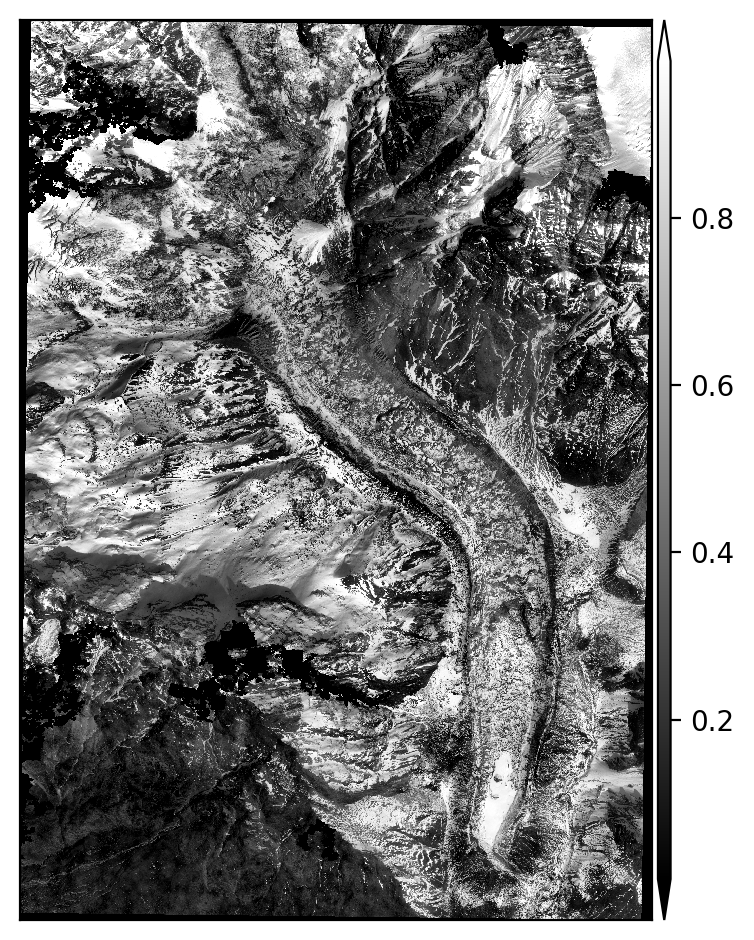

In [12]:
f,ax = plt.subplots()
pltlib.iv(exposure.equalize_adapthist(norm(img1, verbose=False,perc_lim=(2,98)).data),ax=ax,cmap='gray')

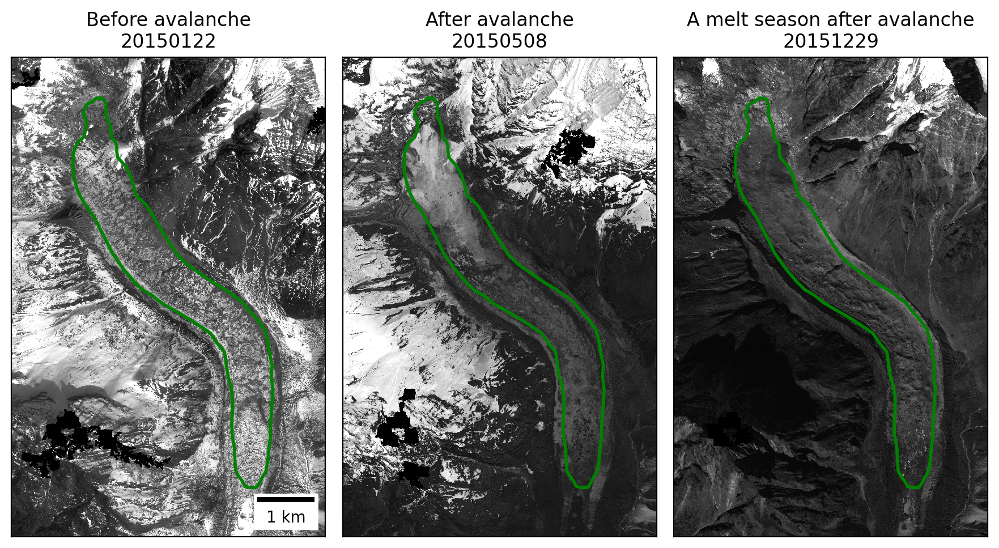

In [13]:
f,ax = plt.subplots(1,3,sharex=True,sharey=True,figsize=(9,5))
pltlib.iv(img1,ax=ax[0],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='Before avalanche\n20150122',clim=malib.calcperc(img1,(0,90)))
pltlib.iv(img2,ax=ax[1],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='After avalanche\n20150508',clim=malib.calcperc(img2,(0,90)))
pltlib.iv(img3,ax=ax[2],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='A melt season after avalanche\n20151229',clim=malib.calcperc(img3,(0,98)))
pltlib.add_scalebar(ax[0],res=2)


for axa in ax.ravel():
        glac_shp.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)
        axa.set_xlim(figure_xlim)
        axa.set_ylim(figure_ylim)
f.savefig('/nobackup/sbhusha1/chapter2/figures/Lirung_orthoimage_preview.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

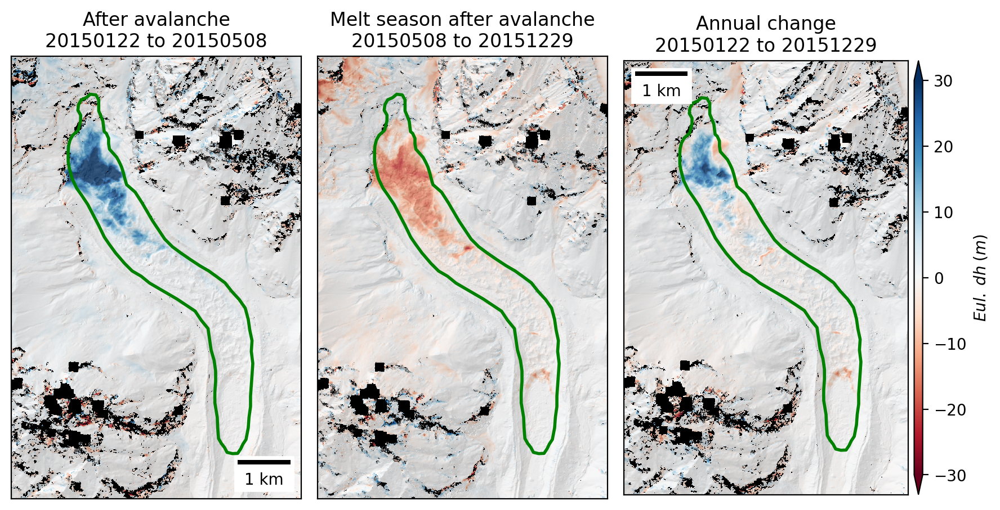

In [14]:
f,ax = plt.subplots(1,3,sharex=True,sharey=True,figsize=(9,5))
pltlib.iv(dem2-dem1,ax=ax[0],cmap='RdBu',cbar=False,scalebar=False,extent=fig_extent,
          title='After avalanche\n20150122 to 20150508',clim=(-30,30),hillshade=True,ds=ds_list[0],full_bg_stretch=True,overlay_alpha=0.8)
pltlib.iv(dem3-dem2,ax=ax[1],cmap='RdBu',cbar=False,scalebar=False,extent=fig_extent,
          title='Melt season after avalanche\n20150508 to 20151229',clim=(-30,30),hillshade=True,ds=ds_list[0],full_bg_stretch=True,overlay_alpha=0.8)
pltlib.iv(dem3-dem1,ax=ax[2],cmap='RdBu',cbar=True,scalebar=True,extent=fig_extent,
          title='Annual change\n20150122 to 20151229',clim=(-30,30),hillshade=True,ds=ds_list[0],
         label=r'$Eul.\; dh \;  (m)$',skinny=False,full_bg_stretch=True,overlay_alpha=0.8)
pltlib.add_scalebar(ax[0],res=2)


for axa in ax.ravel():
        glac_shp.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)
        axa.set_xlim(figure_xlim)
        axa.set_ylim(figure_ylim)
f.savefig('/nobackup/sbhusha1/chapter2/figures/Lirung_dh_preview.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

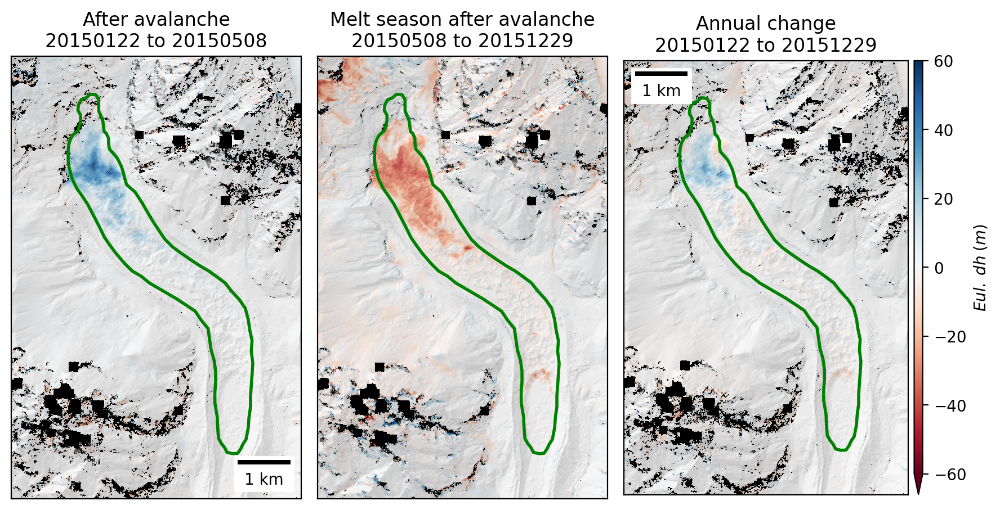

In [15]:
f,ax = plt.subplots(1,3,sharex=True,sharey=True,figsize=(9,5))
pltlib.iv(dem2-dem1,ax=ax[0],cmap='RdBu',cbar=False,scalebar=False,extent=fig_extent,
          title='After avalanche\n20150122 to 20150508',clim=(-60,60),hillshade=True,ds=ds_list[0],full_bg_stretch=True,overlay_alpha=0.8)
pltlib.iv(dem3-dem2,ax=ax[1],cmap='RdBu',cbar=False,scalebar=False,extent=fig_extent,
          title='Melt season after avalanche\n20150508 to 20151229',clim=(-30,30),hillshade=True,ds=ds_list[0],full_bg_stretch=True,overlay_alpha=0.8)
pltlib.iv(dem3-dem1,ax=ax[2],cmap='RdBu',cbar=True,scalebar=True,extent=fig_extent,
          title='Annual change\n20150122 to 20151229',clim=(-60,60),hillshade=True,ds=ds_list[0],
         label=r'$Eul.\; dh \;  (m)$',skinny=False,full_bg_stretch=True,overlay_alpha=0.8)
pltlib.add_scalebar(ax[0],res=2)


for axa in ax.ravel():
        glac_shp.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)
        axa.set_xlim(figure_xlim)
        axa.set_ylim(figure_ylim)
#f.savefig('/nobackup/sbhusha1/chapter2/figures/Lirung_dh_preview.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## This was used only for the AGU fall meeting and thesis defense

In [17]:
zoom_in_xlim = (357089.4029983155, 358521.2415861755)
zoom_in_ylim = (3124535.1394149754, 3126222.663464953)
zoom_in_ylim

(3124535.1394149754, 3126222.663464953)

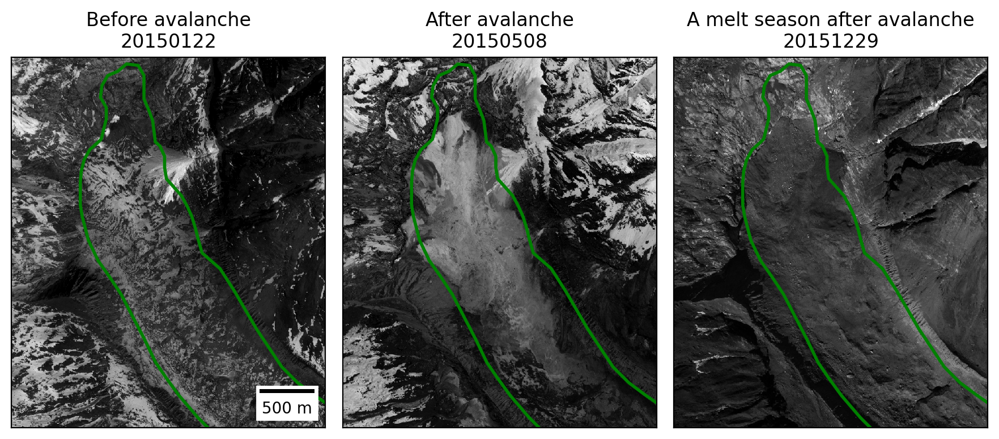

In [18]:
f,ax = plt.subplots(1,3,sharex=True,sharey=True,figsize=(9,5))
pltlib.iv(img1,ax=ax[0],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='Before avalanche\n20150122')
pltlib.iv(img2,ax=ax[1],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='After avalanche\n20150508')
pltlib.iv(img3,ax=ax[2],cmap='gray',cbar=False,scalebar=False,extent=fig_extent,title='A melt season after avalanche\n20151229')
pltlib.add_scalebar(ax[0],res=2)


for axa in ax.ravel():
        glac_shp.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)
        axa.set_xlim(zoom_in_xlim)
        axa.set_ylim(zoom_in_ylim)
f.savefig('/nobackup/sbhusha1/agu22/Lirung_orthoimage_zoomed.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## This is old and exploratory code

In [43]:
dem_list = sorted(glob.glob('20*trans_source-DEM.tif'))

In [12]:
dem_list[0].split('_')[0]+'_aligned.tif'

'20121228_aligned.tif'

In [13]:
rename_dem_list = [x.split('_')[0]+'_aligned.tif' for x in dem_list]
for idx,dem in enumerate(dem_list):
    shutil.copy2(dem,rename_dem_list[idx])
    os.remove(dem)

In [4]:
## Analysis
current_dem_list = sorted(glob.glob('*align.tif'))

In [5]:
current_dem_list

['20120115_0501_10504100005FE600_10504100005C2900-DEM_2m_align.tif',
 '20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif',
 '20150504_0608_102001003F989C00_102001003C281B00-DEM_2m_align.tif',
 '20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif',
 '20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif',
 '20161106_0456_103001005FAB7A00_103001005F7EBB00-DEM_2m_align.tif',
 '20171222_0807_10200100688AC000_102001006F214E00-DEM_2m_align.tif']

In [5]:
dem_ds_list = warplib.memwarp_multi_fn(current_dem_list,extent='union')


Warping all inputs to the following:
Resolution: 2.0
Extent: [354127.0, 3121505.0, 362175.0, 3130559.0]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 7: 20120115_0501_10504100005FE600_10504100005C2900-DEM_2m_align.tif
nl: 4527 ns: 4024 res: 2.000
0...10...20...30...40...50...60...70...80...90...2 of 7: 20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif
nl: 4527 ns: 4024 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...3 of 7: 20150504_0608_102001003F989C00_102001003C281B00-DEM_2m_align.tif
nl: 4527 ns: 4024 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...4 of 7: 20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif
nl: 4527 ns: 4024 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...5 of 7: 20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif
nl: 4527 ns: 4024 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...6 of 

In [6]:
ma_list = [iolib.ds_getma(ds) for ds in dem_ds_list]

In [7]:
ds_extent = geolib.ds_extent(dem_ds_list[0])
enhance_width = 500
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],
              ds_extent[3]]

In [8]:
lirung_shape = gpd.read_file(constants.fetch_glac_shp(
    constants.rgi_dicts['lirung'])).to_crs(
    'EPSG:32645')
tot_bounds = lirung_shape.total_bounds

In [9]:
tot_bounds

array([ 357403.87722052, 3122770.43265357,  359158.8575413 ,
       3126191.43174646])

In [23]:
%matplotlib inline

#use constant clims, no colorbar except for the one at the very end, smaller size of canvas

In [18]:
str(timelib.fn_getdatetime(current_dem_list[0])).split(" ")[0]

'2012-01-15'

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("cpt_rainbow").copy()
  cmap.set_bad('k', alpha=1)
/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("gray").copy()
  cmap.set_bad('k', alpha=1)
/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:69: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. Th

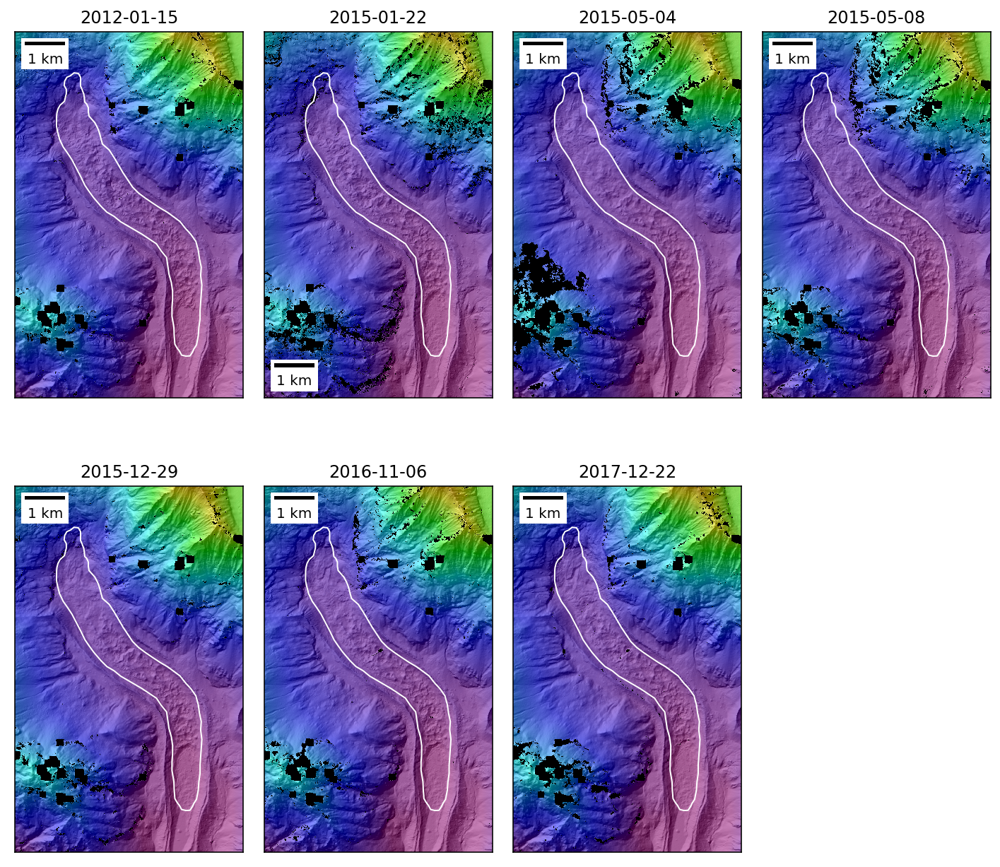

In [30]:
elev_clim = (4000,7000)
f,axa = plt.subplots(2,4,figsize=(10,10))
for idx, ax in enumerate(axa.ravel()):
    
    if idx <=6:
        label = f'{str(timelib.fn_getdatetime(current_dem_list[idx])).split(" ")[0]}'
        pltlib.iv(ma_list[idx],ax=ax,ds=dem_ds_list[idx],
                  hillshade=True,title=label,extent=fig_extent,
                 clim=elev_clim,cbar=False)
        lirung_shape.plot(ax=ax,edgecolor='white',facecolor='None')
        ax.set_xlim(tot_bounds[0]-enhance_width,tot_bounds[2]+enhance_width)
        ax.set_ylim(tot_bounds[1]-enhance_width,tot_bounds[3]+enhance_width)
    else:
        ax.remove()
plt.tight_layout()

Use cases from here:
* Annual Mass balance curve for Lirung Glacier: 20161106 to 20171222 
* Lirung Glacier melt enhancement factors: 20161106 to 20171222
* Summer contribution to melting : partition contribution from 20150122 to 20150504 (winter), and 20150504 to 20151229 (summer period + bit of winter)
* Avalanche contribution and process, residual snowdepth 20150122 to 20150504, 20150504 to 20151229 and then 20151229 to 20161106
* How much has the rate of mass loss changed from 20121228 to 20151229 vs 20161106 to 20171222 (low priority) 

In [45]:
%matplotlib inline

In [27]:
current_dem_list

['20120115_0501_10504100005FE600_10504100005C2900-DEM_2m_align.tif',
 '20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif',
 '20150504_0608_102001003F989C00_102001003C281B00-DEM_2m_align.tif',
 '20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif',
 '20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif',
 '20161106_0456_103001005FAB7A00_103001005F7EBB00-DEM_2m_align.tif',
 '20171222_0807_10200100688AC000_102001006F214E00-DEM_2m_align.tif']

#### Question 1 and Question 2:
##### Annual Mass balance curve for Lirung Glacier: 20161106 to 20171222

##### Lirung Glacier melt enhancement factors: 20161106 to 20171222

In [30]:
%matplotlib inline

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)


(3122270.432653568, 3126691.431746461)

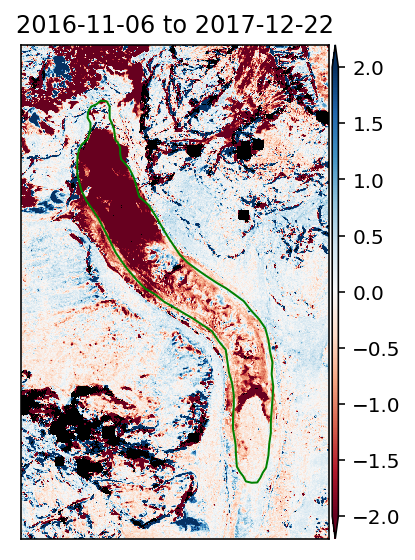

In [32]:
f,ax = plt.subplots()
b_idx = -1
s_idx = -2
pltlib.iv(ma_list[b_idx]-ma_list[s_idx],ax=ax,
          cmap='RdBu',clim=(-2,2),
          title = f'{str(timelib.fn_getdatetime(current_dem_list[s_idx])).split(" ")[0]} to {str(timelib.fn_getdatetime(current_dem_list[b_idx])).split(" ")[0]}',
         extent=fig_extent)
lirung_shape.plot(ax=ax,edgecolor='green',facecolor='None')
ax.set_xlim(tot_bounds[0]-enhance_width,tot_bounds[2]+enhance_width)
ax.set_ylim(tot_bounds[1]-enhance_width,tot_bounds[3]+enhance_width)

#### Question 3:
##### Summer contribution to melting : partition contribution from 20150122 to 20150504 (winter), and 20150504 to 20151229 (summer period + bit of winter)

In [48]:
%matplotlib inline

In [47]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
b_idx = 3
s_idx = 1
pltlib.iv(ma_list[b_idx]-ma_list[s_idx],ax=ax[0],
          cmap='RdBu',clim=(-2,2),
          title = f'{str(timelib.fn_getdatetime(current_dem_list[s_idx])).split(" ")[0]} to {str(timelib.fn_getdatetime(current_dem_list[b_idx])).split(" ")[0]}',
         extent=fig_extent)
b_idx = 4
s_idx = 3
pltlib.iv(ma_list[b_idx]-ma_list[s_idx],ax=ax[1],
          cmap='RdBu',clim=(-2,2),
          title = f'{str(timelib.fn_getdatetime(current_dem_list[s_idx])).split(" ")[0]} to {str(timelib.fn_getdatetime(current_dem_list[b_idx])).split(" ")[0]}',
         extent=fig_extent)
for axa in ax:
    lirung_shape.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)

    axa.set_xlim(tot_bounds[0]-enhance_width,tot_bounds[2]+enhance_width)
    axa.set_ylim(tot_bounds[1]-enhance_width,tot_bounds[3]+enhance_width)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)


In [46]:
zoom_x = (358206.3393735684, 359445.1408929805)
zoom_y = (3122370.381463239, 3124503.872968893)

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)


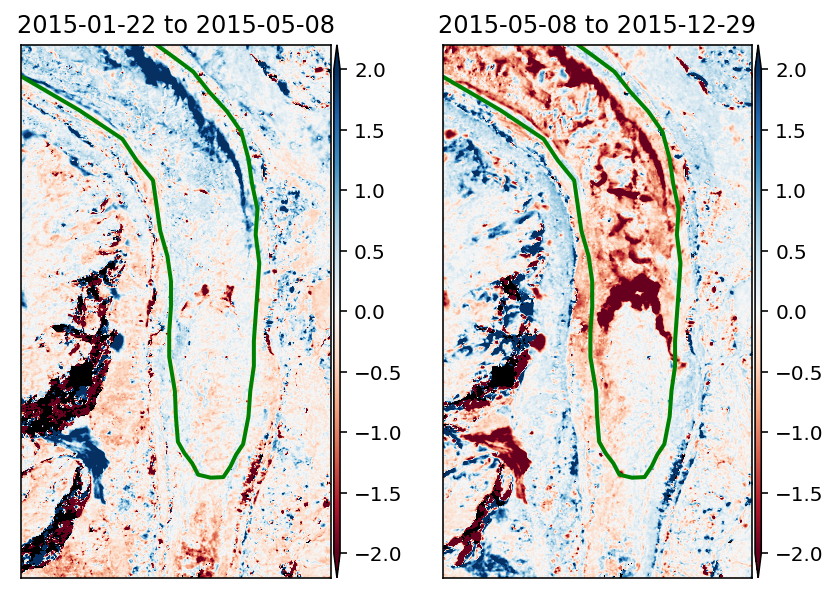

In [49]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
b_idx = 3
s_idx = 1
pltlib.iv(ma_list[b_idx]-ma_list[s_idx],ax=ax[0],
          cmap='RdBu',clim=(-2,2),
          title = f'{str(timelib.fn_getdatetime(current_dem_list[s_idx])).split(" ")[0]} to {str(timelib.fn_getdatetime(current_dem_list[b_idx])).split(" ")[0]}',
         extent=fig_extent)
b_idx = 4
s_idx = 3
pltlib.iv(ma_list[b_idx]-ma_list[s_idx],ax=ax[1],
          cmap='RdBu',clim=(-2,2),
          title = f'{str(timelib.fn_getdatetime(current_dem_list[s_idx])).split(" ")[0]} to {str(timelib.fn_getdatetime(current_dem_list[b_idx])).split(" ")[0]}',
         extent=fig_extent)
for axa in ax:
    lirung_shape.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)

    axa.set_xlim(zoom_x[0],zoom_x[1])
    axa.set_ylim(zoom_y[0],zoom_y[1])

#### Question 4
##### Avalanche contribution and process, residual snowdepth 20150122 to 20150504, 20150504 to 20151229 and then 20151229 to 20161106

In [56]:
%matplotlib widget

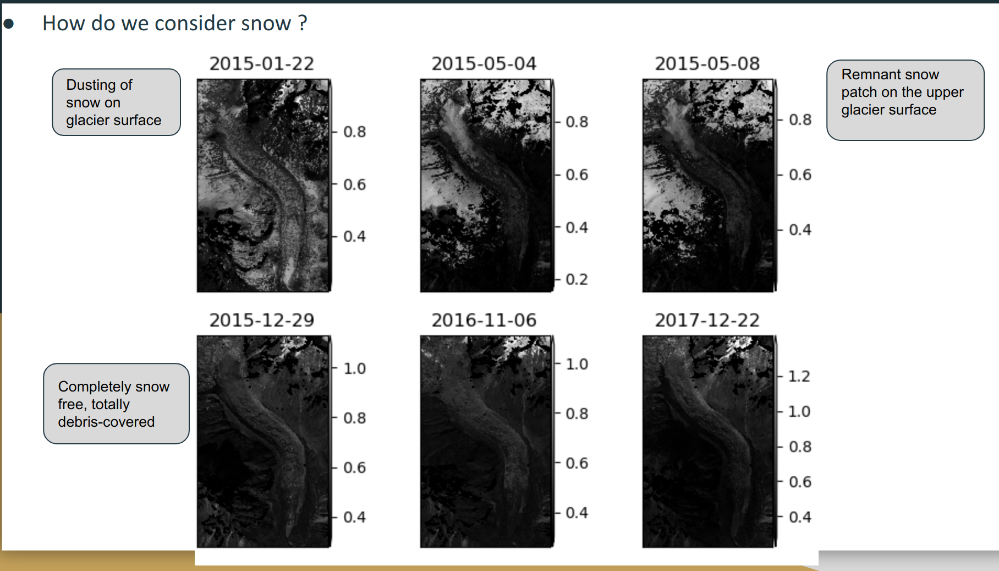

In [12]:
%matplotlib inline

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)


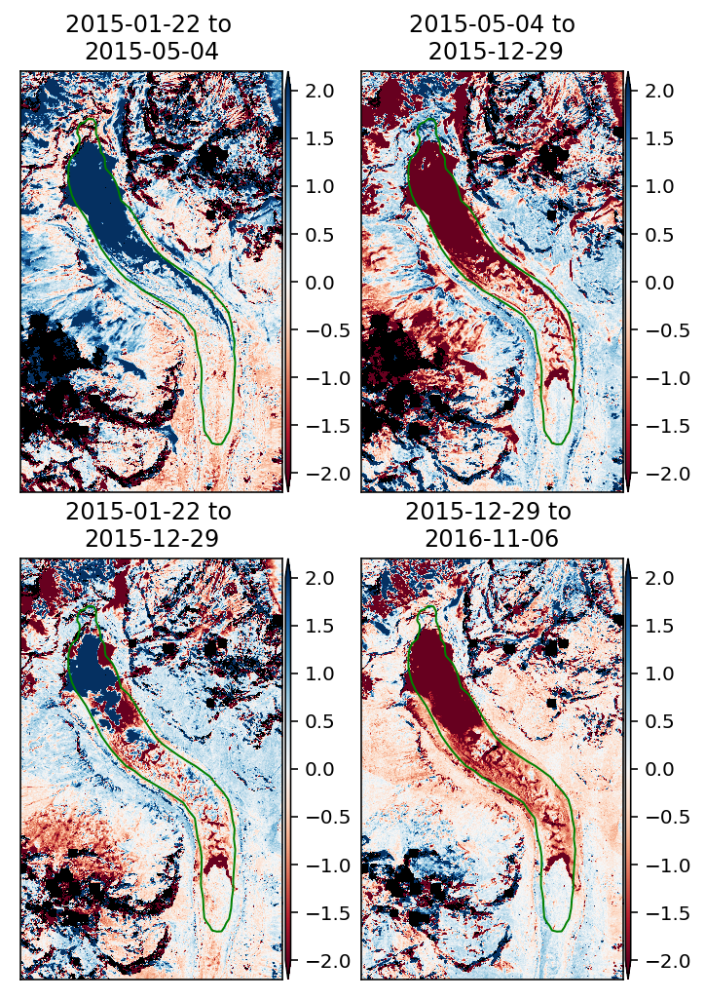

In [13]:
dem1_idx = 1
dem2_idx = 2
dem3_idx = 4
dem4_idx = 5
dt1 = str(timelib.fn_getdatetime(current_dem_list[dem1_idx])).split(" ")[0]
dt2 = str(timelib.fn_getdatetime(current_dem_list[dem2_idx])).split(" ")[0]
dt3 = str(timelib.fn_getdatetime(current_dem_list[dem3_idx])).split(" ")[0]
dt4 = str(timelib.fn_getdatetime(current_dem_list[dem4_idx])).split(" ")[0]
f,ax = plt.subplots(2,2,sharex=True,sharey=True,figsize=(5,10))
pltlib.iv(ma_list[dem2_idx]-ma_list[dem1_idx],ax=ax[0,0],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt1} to \n{dt2}",
         extent=fig_extent)
pltlib.iv(ma_list[dem3_idx]-ma_list[dem2_idx],ax=ax[0,1],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt2} to\n {dt3}",
         extent=fig_extent)
pltlib.iv(ma_list[dem3_idx]-ma_list[dem1_idx],ax=ax[1,0],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt1} to \n{dt3}",
         extent=fig_extent)
pltlib.iv(ma_list[dem4_idx]-ma_list[dem3_idx],ax=ax[1,1],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt3} to \n{dt4}",
         extent=fig_extent)
for axa in ax.ravel():
    lirung_shape.plot(ax=axa,edgecolor='green',facecolor='None')

    axa.set_xlim(tot_bounds[0]-enhance_width,tot_bounds[2]+enhance_width)
    axa.set_ylim(tot_bounds[1]-enhance_width,tot_bounds[3]+enhance_width)

#### See figure above, we have to fix co-reg and snow issues

#### Question 5:
##### How much has the rate of mass loss changed from 20121228 to 20151229 vs 20161106 to 20171222 (low priority) 

In [58]:
current_dem_list

['20120115_0501_10504100005FE600_10504100005C2900-DEM_2m_align.tif',
 '20150122_0508_1040010006841E00_10400100060FE200-DEM_2m_align.tif',
 '20150504_0608_102001003F989C00_102001003C281B00-DEM_2m_align.tif',
 '20150508_0455_104001000BA62E00_104001000B3B2300-DEM_2m_align.tif',
 '20151229_0721_10200100496BE700_1020010046506C00-DEM_2m_align.tif',
 '20161106_0456_103001005FAB7A00_103001005F7EBB00-DEM_2m_align.tif',
 '20171222_0807_10200100688AC000_102001006F214E00-DEM_2m_align.tif']

In [10]:
dem1_idx = 0
dem2_idx = 4
dem3_idx = -2
dem4_idx = -1
dt1 = str(timelib.fn_getdatetime(current_dem_list[dem1_idx])).split(" ")[0]
dt2 = str(timelib.fn_getdatetime(current_dem_list[dem2_idx])).split(" ")[0]
dt3 = str(timelib.fn_getdatetime(current_dem_list[dem3_idx])).split(" ")[0]
dt4 = str(timelib.fn_getdatetime(current_dem_list[dem4_idx])).split(" ")[0]
#dem5_idx = None
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
t_factor = timelib.get_t_factor(timelib.fn_getdatetime(current_dem_list[dem1_idx]),
                                timelib.fn_getdatetime(current_dem_list[dem2_idx]))

pltlib.iv((ma_list[dem2_idx]-ma_list[dem1_idx])/t_factor,ax=ax[0],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt1} to {dt2}",
         extent=fig_extent)
t_factor = timelib.get_t_factor(timelib.fn_getdatetime(current_dem_list[dem3_idx]),
                                timelib.fn_getdatetime(current_dem_list[dem4_idx]))
                                
                                
pltlib.iv((ma_list[dem4_idx]-ma_list[dem3_idx])/t_factor,ax=ax[1],
          cmap='RdBu',clim=(-2,2),
          title = f"{dt3} to {dt4}",
         extent=fig_extent)
for axa in ax.ravel():
    lirung_shape.plot(ax=axa,edgecolor='green',facecolor='None',linewidth=2)

    axa.set_xlim(tot_bounds[0]-enhance_width,tot_bounds[2]+enhance_width)
    axa.set_ylim(tot_bounds[1]-enhance_width,tot_bounds[3]+enhance_width)

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)
/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu").copy()
  cmap.set_bad('k', alpha=1)


In [10]:
constants.fetch_glac_shp(
    constants.rgi_dicts['ngozumpa'])

'/nobackup/sbhusha1/reference_data/lagdz_shp_fn/RGI60-15.03473_shp.gpkg'

#### Plot

In [6]:
melt_df = pd.read_csv(sorted(glob.glob('/nobackupp19/deshean/ps_velocity/lirung/lirung_stack/lirung_farinotti_2016-11-06_to_2017-12-22_lag_smb_products/*.csv'))[0])

In [7]:
melt_df

,med_bg_dhdt,nmad_bg_dhdt,area_bg,med_hotspot_dhdt,nmad_hotspot_dhdt,area_hotspot,med_clean_dhdt,nmad_clean_dhdt,area_clean,med_total_dhdt,nmad_total_dhdt,area_total,med_deb_thick,nmad_deb_thick,med_vm,nmad_vm,z_area,z_bin_centers
0,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,0.000000,0.55,0.00,0.09,0.08,0.001212,3925.0
1,-0.25,0.28,0.170792,-4.50,0.82,0.000316,-0.10,0.27,0.000308,-0.25,0.28,0.171416,0.48,0.16,0.26,0.17,0.213532,3975.0
2,-1.14,0.74,0.053016,-7.30,4.19,0.017628,NaN,NaN,0.000000,-1.47,1.22,0.070644,0.48,0.14,0.88,0.61,0.120992,4025.0
3,-0.75,0.63,0.133428,-4.63,1.83,0.002084,NaN,NaN,0.000000,-0.76,0.64,0.135512,0.41,0.18,1.05,0.48,0.169044,4075.0
4,-0.61,1.02,0.140468,NaN,NaN,0.000000,0.17,0.00,0.000004,-0.61,1.02,0.140472,0.48,0.09,1.36,0.76,0.182848,4125.0
5,-1.29,2.04,0.145152,-5.43,2.37,0.003312,0.57,0.47,0.000412,-1.36,2.05,0.148876,0.51,0.05,1.75,1.57,0.211164,4175.0
6,-1.82,3.01,0.312000,-3.89,1.57,0.009572,1.28,1.13,0.000620,-1.90,3.04,0.322192,0.34,0.06,3.00,1.72,0.398356,4225.0
7,-4.78,4.57,0.217080,-4.30,0.77,0.002680,-3.54,2.01,0.006920,-4.69,4.41,0.226680,0.22,0.04,2.14,1.62,0.330036,4275.0
8,-4.23,1.90,0.037540,NaN,NaN,0.000000,-4.70,2.54,0.001560,-4.25,1.92,0.039100,0.16,0.04,0.84,0.73,0.104936,4325.0
9,0.31,0.74,0.006192,-4.14,4.40,0.000316,NaN,NaN,0.000000,0.27,0.82,0.006508,0.16,0.01,0.44,0.39,0.022192,4375.0


In [8]:
%matplotlib widget

In [9]:
f,ax = plt.subplots()
ax.bar(melt_df.z_bin_centers,melt_df.med_total_dhdt,width=50,color='teal')
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('dhdt due to SMB (m/yr)')

ax.set_ylim(-5,2)
ax.axhline(0,linestyle='--',c='k')
ax2=ax.twinx()
ax2.scatter(melt_df.z_bin_centers,melt_df.med_deb_thick,c='red',marker='*')
ax2.set_ylim(0,0.5)
ax2.set_ylabel('Debris thickness (m)')
plt.savefig('/nobackup/sbhusha1/nwg/lirung_smb.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [11]:
f,ax = plt.subplots()
ax.plot(melt_df.z_bin_centers,melt_df.med_total_dhdt,color='black')
ax.fill_between(melt_df.z_bin_centers,melt_df.med_total_dhdt-melt_df.nmad_total_dhdt,
                melt_df.med_total_dhdt+melt_df.nmad_total_dhdt,color='black',alpha=0.5)
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('dhdt due to SMB (m/yr)')

ax.set_ylim(-10,2)
ax.axhline(0,linestyle='--',c='k')
ax2=ax.twinx()
ax2.scatter(melt_df.z_bin_centers,melt_df.med_deb_thick,c='red',marker='*')
ax2.set_ylim(0,0.5)
ax2.set_ylabel('Debris thickness (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'Debris thickness (m)')

In [12]:
lirung_smb_fn = 'lirung_farinotti_2016-11-06_to_2017-12-22_lag_smb_products/lirung_farinotti_2016-11-06_to_2017-12-22_smb_dhdt.tif'
lirung_dem_fn = '20161106_0456_103001005FAB7A00_103001005F7EBB00-DEM_2m_align.tif'
lirung_debris_thickness_fn = constants.fetch_rounce_debris_thickness('lirung')
lirung_shp = gpd.read_file(constants.fetch_glac_shp(constants.rgi_dicts['lirung'])).to_crs('EPSG:32645')
ds_list = warplib.memwarp_multi_fn([lirung_smb_fn,lirung_dem_fn,lirung_debris_thickness_fn],r='cubicspline')
lirung_smb,lirung_dem,lirung_debris = [iolib.ds_getma(ds) for ds in ds_list]
lirung_dem = velocity_timeseries.mask_by_shp(lirung_shp.geometry,lirung_dem,ds=ds_list[1])

debris thickness not found, will return extrap product

Warping all inputs to the following:
Resolution: 2.0
Extent: [356357.690027757, 3121759.9429278406, 360202.7721008597, 3127205.987433165]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubicspline

1 of 3: lirung_farinotti_2016-11-06_to_2017-12-22_lag_smb_products/lirung_farinotti_2016-11-06_to_2017-12-22_smb_dhdt.tif
nl: 2723 ns: 1923 res: 2.000
0...10...20...30...40...50...60...70...80...90...2 of 3: 20161106_0456_103001005FAB7A00_103001005F7EBB00-DEM_2m_align.tif
nl: 2723 ns: 1923 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...3 of 3: /nobackupp11/sbhusha1/hma/lagdz_samples/debris_thickness/HMA_DTE_15.04045_hdts_m_extrap.tif
nl: 2723 ns: 1923 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...

In [13]:
bin_width = 50
res = (2,2)
z1 = lirung_dem
z_bin_edges, z_bin_centers = malib.get_bins(z1, bin_width)
z1_bin_counts, z1_bin_edges = np.histogram(z1.compressed(), bins=z_bin_edges)
z1_bin_areas = z1_bin_counts * res[0] * res[1] / 1E6

In [14]:
f,ax = plt.subplots()
pltlib.iv(lirung_smb,ax=ax)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/nobackupp16/swbuild3/sbhusha1/pip_git_sw/imview/imview/lib/pltlib.py:155: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("cpt_rainbow").copy()
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [39]:
idx

array([[14, 14, 14, ..., 14, 14, 14],
       [14, 14, 14, ..., 14, 14, 14],
       [14, 14, 14, ..., 14, 14, 14],
       ...,
       [ 0,  0,  0, ...,  5,  5,  5],
       [ 0,  0,  0, ...,  5,  5,  5],
       [ 0,  0,  0, ...,  5,  5,  5]])

In [42]:
np.nanpercentile(?)

SyntaxError: invalid syntax (2249975432.py, line 1)

In [15]:
debris_boxes_list = []
smb_boxes_list = []
debris_boxes_list_nowhisker = []
smb_boxes_list_nowhisker = []
idx = np.digitize(z1,z_bin_edges)
for bin_n in range(z_bin_centers.size):
    debris_tickness_samp = lirung_debris[(idx==bin_n+1)]
    smb_samp = lirung_smb[(idx==bin_n+1)]
    debris_q1,debris_med,debris_q3 = np.nanpercentile(debris_tickness_samp.filled(np.nan),(25,50,75))
    iqr = 1.5*(debris_q3-debris_q1)
    
    debris_box_temp = {
            'label':z_bin_centers[bin_n],
            'positions':z_bin_centers[bin_n],
            'whislo':debris_q1 - iqr,
            'q1':debris_q1,
            'med':debris_med,
            'q3':debris_q3,
            'whishi':debris_q3+iqr,
            'fliers':[]
        }
    debris_boxes_list.append(debris_box_temp)
    debris_box_temp = {
            'label':z_bin_centers[bin_n],
            'positions':z_bin_centers[bin_n],
            'whislo':debris_q1,
            'q1':debris_q1,
            'med':debris_med,
            'q3':debris_q3,
            'whishi':debris_q3,
            'fliers':[]
        }
    debris_boxes_list_nowhisker.append(debris_box_temp)
    smb_q1,smb_med,smb_q3 = np.nanpercentile(smb_samp.filled(np.nan),(25,50,75))
    iqr = 1.5*(smb_q3-smb_q1)
    smb_box_temp = {
            'label':z_bin_centers[bin_n],
            'positions':z_bin_centers[bin_n],
            'whislo':smb_q3 - iqr,
            'q1':smb_q1,
            'med':smb_med,
            'q3':smb_q3,
            'whishi':smb_q3+iqr,
            'fliers':[]
        }
    
    
    smb_boxes_list.append(smb_box_temp)
    
    smb_box_temp = {
            'label':z_bin_centers[bin_n],
            'positions':z_bin_centers[bin_n],
            'whislo':smb_q1,
            'q1':smb_q1,
            'med':smb_med,
            'q3':smb_q3,
            'whishi':smb_q3,
            'fliers':[]
        }
    smb_boxes_list_nowhisker.append(smb_box_temp)

In [16]:
np.arange(3900,4600,100)

array([3900, 4000, 4100, 4200, 4300, 4400, 4500])

In [17]:
f,ax = plt.subplots()
ax.bxp(smb_boxes_list,showfliers=False,positions=z_bin_centers,widths=50)
ax.set_xticks(np.arange(3900,4700,100))
ax.set_xticklabels(np.arange(3900,4700,100))
ax.axhline(y=0)
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('DhDt due to surface processes (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'DhDt due to surface processes (m)')

In [18]:
f,ax = plt.subplots()
ax.bxp(smb_boxes_list_nowhisker,showfliers=False,positions=z_bin_centers,widths=50)
ax.set_xticks(np.arange(3900,4700,100))
ax.set_xticklabels(np.arange(3900,4700,100))
ax.axhline(y=0)
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('DhDt due to surface processes (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'DhDt due to surface processes (m)')

In [19]:
f,ax = plt.subplots()
ax.bxp(debris_boxes_list,showfliers=False,positions=z_bin_centers,widths=50)
ax.set_xticks(np.arange(3900,4700,100))
ax.set_xticklabels(np.arange(3900,4700,100))
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('Debris thickness (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'Debris thickness (m)')

In [38]:
stats_df = melt_df

In [58]:
f,ax = plt.subplots(3,1,sharex=True,figsize=(9,8))
#ax2=ax[0].twinx()
#ax2.bar(melt_df.z_bin_centers,melt_df.area_total,color='brown',width=100)
ax[0].plot(melt_df.z_bin_centers,melt_df.med_total_dhdt,color='black')
ax[0].fill_between(melt_df.z_bin_centers,melt_df.med_total_dhdt-melt_df.nmad_total_dhdt,
                melt_df.med_total_dhdt+melt_df.nmad_total_dhdt,color='black',alpha=0.5)
ax[0].set_title('Lirung Glacier 2016-11-06_to_2017-12-22')
#ax.set_xlabel('Elevation (m)')

ax[0].set_ylabel('Dh/Dt due to SMB (m/yr)')
ax[0].set_ylim(-10,2)
ax[0].axhline(0,linestyle='--',c='k')

c = 'gray'
debris_box_p = ax[1].bxp(debris_boxes_list_nowhisker,showfliers=False,positions=z_bin_centers,widths=50,
                        patch_artist=True)
plt.setp(debris_box_p['boxes'], color='k')
plt.setp(debris_box_p['medians'], color='k')
plt.setp(debris_box_p["boxes"], facecolor=c)
#for idx in range(len(debris_box_p['boxes'])):
 #   boxes.set(facecolor='gray')
ax[1].set_xticks(np.arange(3900,4700,100))
ax[1].set_ylim(0,.8)
ax[1].set_xticklabels(np.arange(3900,4700,100))

ax[1].set_ylabel('Debris thickness a(m)')

ax[2].bar(stats_df.z_bin_centers,stats_df.area_total,width=50,color='gray',edgecolor='black')
ax[2].set_ylabel('Area ($km^2$)')
ax[2].set_xlabel('Elevation (m)')
ax[2].set_xlim(3949,4601)
plt.tight_layout()
plt.savefig('/nobackup/sbhusha1/agu22/lirung_smb_curve.png',dpi=300,bbox_inches='tight',pad_inches=0.1)
#color the box plot by area using blues ...
#edge colors to bar plots in melt seperation figures
# 1 to 1 line for clean ice glaciers smb gradient, not pissible for debris-covered glaciers
# then we can start talking about the accumulation process
#ax2.set_ylabel('Area ($m^2$)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [53]:
mkdir /nobackup/sbhusha1/agu22/

In [18]:
f,ax = plt.subplots()
ax.plot(melt_df.z_bin_centers,melt_df.med_total_dhdt,color='teal')
ax.fill_between(melt_df.z_bin_centers,melt_df.med_total_dhdt-melt_df.nmad_total_dhdt,
                melt_df.med_total_dhdt+melt_df.nmad_total_dhdt,color='teal',alpha=0.5)
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('dhdt due to SMB (m/yr)')

ax.set_ylim(-10,2)
ax.axhline(0,linestyle='--',c='k')
ax2=ax.twinx()
ax2.scatter(melt_df.z_bin_centers,melt_df.med_deb_thick,c='red',marker='*')
ax2.set_ylim(0,0.5)
ax2.set_ylabel('Debris thickness (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'Debris thickness (m)')

In [19]:
f,ax = plt.subplots()
ax.bxp(debris_boxes_list_nowhisker,showfliers=False,positions=z_bin_centers,widths=50)
ax.set_xticks(np.arange(3900,4700,100))
ax.set_xticklabels(np.arange(3900,4700,100))
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('Debris thickness (m)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'Debris thickness (m)')

In [15]:
# from https://stackoverflow.com/questions/27214537/is-it-possible-to-draw-a-matplotlib-boxplot-given-the-percentile-values-instead
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
boxes = [
    {
        'label' : "Male height",
        'whislo': 162.6,    # Bottom whisker position
        'q1'    : 170.2,    # First quartile (25th percentile)
        'med'   : 175.7,    # Median         (50th percentile)
        'q3'    : 180.4,    # Third quartile (75th percentile)
        'whishi': 187.8,    # Top whisker position
        'fliers': []        # Outliers
    }
]
ax.bxp(boxes, showfliers=False)
ax.set_ylabel("cm")
#plt.savefig("boxplot.png")
#plt.close()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'cm')